## INTRODUCTION


As a telecommunications company, we are facing challenges in retaining customers. Customer churn, defined as the rate at which customers stop doing business with a company, is a significant issue impacting revenue and profitability. To address this, we aim to build a customer churn prediction model that will help identify customers likely to leave and enable us to take proactive retention measures.

The analysis uses historical customer data from SyriaTel to uncover patterns and insights that drive churn behavior and provide actionable strategies to improve customer retention.

## BACKGROUND


According to industry research, customer churn is one of the largest challenges for telecom companies, resulting in billions of dollars in lost revenue annually. High competition, price wars, and poor customer experience often lead to customer dissatisfaction.

Telecom companies typically analyze customer demographics, service usage, and interactions with customer support to understand churn patterns. By identifying at-risk customers, businesses can implement strategies like loyalty programs, improved services, and better customer engagement.

This project leverages historical customer behavior data to predict churn, reduce revenue loss, and ensure long-term business growth.



## BUSINESS PROBLEM

Customer churn results in significant revenue loss for telecommunications companies. SyriaTel currently faces increasing churn rates, which threaten its market position and financial stability.

The primary challenge is to identify customers at risk of churning and determine the underlying factors contributing to churn. SyriaTel lacks a systematic approach to predict churn and retain customers, making it essential to leverage data analytics to build a churn prediction model.

By addressing this problem, the company can reduce customer attrition, improve customer satisfaction, and increase profitability.

## OBJECTIVES


1.Explore the key factors that influence customer churn.
2.Build a machine learning classifier to predict customer churn.
3.Identify actionable insights to reduce churn and improve customer retention strategies.

## Data  Preparation

In [1]:
#Import the necessary libraries
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
import numpy as np

In [2]:
#loading the data
df=pd.read_csv('churn.csv')
df.head()

,state,account length,area code,phone number,international plan,voice mail plan,number vmail messages,total day minutes,total day calls,total day charge,...,total eve calls,total eve charge,total night minutes,total night calls,total night charge,total intl minutes,total intl calls,total intl charge,customer service calls,churn
0,KS,128,415,382-4657,no,yes,25,265.1,110,45.07,...,99,16.78,244.7,91,11.01,10.0,3,2.70,1,False
1,OH,107,415,371-7191,no,yes,26,161.6,123,27.47,...,103,16.62,254.4,103,11.45,13.7,3,3.70,1,False
2,NJ,137,415,358-1921,no,no,0,243.4,114,41.38,...,110,10.30,162.6,104,7.32,12.2,5,3.29,0,False
3,OH,84,408,375-9999,yes,no,0,299.4,71,50.90,...,88,5.26,196.9,89,8.86,6.6,7,1.78,2,False
4,OK,75,415,330-6626,yes,no,0,166.7,113,28.34,...,122,12.61,186.9,121,8.41,10.1,3,2.73,3,False


In [3]:
#checking for how many columns
df.columns

Index(['state', 'account length', 'area code', 'phone number',
       'international plan', 'voice mail plan', 'number vmail messages',
       'total day minutes', 'total day calls', 'total day charge',
       'total eve minutes', 'total eve calls', 'total eve charge',
       'total night minutes', 'total night calls', 'total night charge',
       'total intl minutes', 'total intl calls', 'total intl charge',
       'customer service calls', 'churn'],
      dtype='object')

In [4]:
#checking how many rows and clumns
df.shape

(3333, 21)

In [5]:
#checking for null values
df.isna().sum()

state                     0
account length            0
area code                 0
phone number              0
international plan        0
voice mail plan           0
number vmail messages     0
total day minutes         0
total day calls           0
total day charge          0
total eve minutes         0
total eve calls           0
total eve charge          0
total night minutes       0
total night calls         0
total night charge        0
total intl minutes        0
total intl calls          0
total intl charge         0
customer service calls    0
churn                     0
dtype: int64

In [6]:
# checking for column information
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 3333 entries, 0 to 3332
Data columns (total 21 columns):
 #   Column                  Non-Null Count  Dtype  
---  ------                  --------------  -----  
 0   state                   3333 non-null   object 
 1   account length          3333 non-null   int64  
 2   area code               3333 non-null   int64  
 3   phone number            3333 non-null   object 
 4   international plan      3333 non-null   object 
 5   voice mail plan         3333 non-null   object 
 6   number vmail messages   3333 non-null   int64  
 7   total day minutes       3333 non-null   float64
 8   total day calls         3333 non-null   int64  
 9   total day charge        3333 non-null   float64
 10  total eve minutes       3333 non-null   float64
 11  total eve calls         3333 non-null   int64  
 12  total eve charge        3333 non-null   float64
 13  total night minutes     3333 non-null   float64
 14  total night calls       3333 non-null   

In [7]:
# Create numeric & categorical lists
numeric_cols = ['account length','number vmail messages','total day minutes','total day calls','total day charge',
                'total eve minutes','total eve calls','total eve charge','total night minutes','total night calls',
                'total night charge','total intl minutes','total intl calls','total intl charge','customer service calls']
categoric_cols = ['state','area code','international plan','voice mail plan']

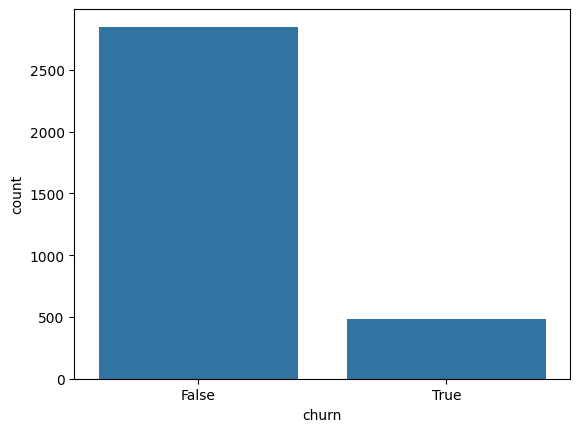

In [8]:
# Countplot of churn feature

sns.countplot(data=df, x='churn')
plt.show()

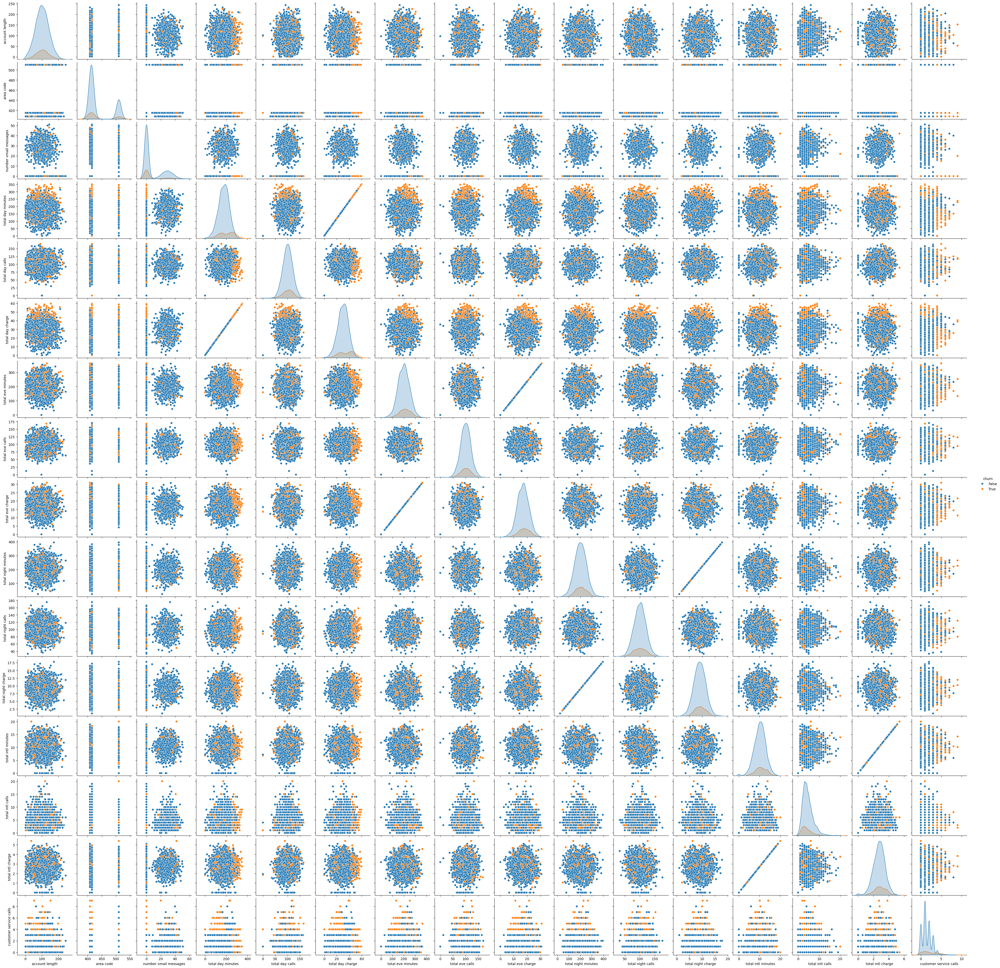

In [9]:
sns.pairplot(df,hue="churn")
plt.show()

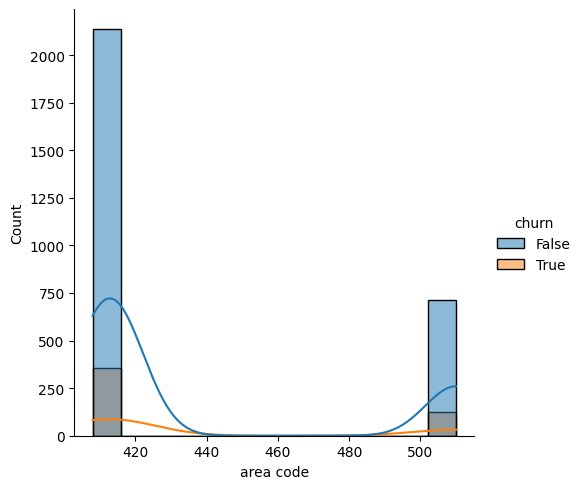

In [10]:
sns.displot(df,x="area code",hue="churn",kde=True)
plt.show()

In [11]:
# Replace 'yes' and 'no' values in 'international plan' and 'voice mail plan' columns 
# with numeric values 1 and 0, and convert the columns to integer type for modeling purposes.
df[['international plan', 'voice mail plan']] = df[['international plan', 'voice mail plan']].replace(['yes', 'no'], ['1', '0']).astype(int)

In [12]:
#drop the  phone number column
df=df.drop(columns='phone number')
df.head()

,state,account length,area code,international plan,voice mail plan,number vmail messages,total day minutes,total day calls,total day charge,total eve minutes,total eve calls,total eve charge,total night minutes,total night calls,total night charge,total intl minutes,total intl calls,total intl charge,customer service calls,churn
0,KS,128,415,0,1,25,265.1,110,45.07,197.4,99,16.78,244.7,91,11.01,10.0,3,2.70,1,False
1,OH,107,415,0,1,26,161.6,123,27.47,195.5,103,16.62,254.4,103,11.45,13.7,3,3.70,1,False
2,NJ,137,415,0,0,0,243.4,114,41.38,121.2,110,10.30,162.6,104,7.32,12.2,5,3.29,0,False
3,OH,84,408,1,0,0,299.4,71,50.90,61.9,88,5.26,196.9,89,8.86,6.6,7,1.78,2,False
4,OK,75,415,1,0,0,166.7,113,28.34,148.3,122,12.61,186.9,121,8.41,10.1,3,2.73,3,False


In [13]:
#assign the feature and target variables as X and Y
x=df.drop(columns='churn',axis=1)
y=df['churn']

In [14]:
#import necessary libraries
from sklearn.preprocessing import OneHotEncoder
from sklearn.preprocessing import StandardScaler
from sklearn.model_selection import train_test_split
from sklearn.compose import ColumnTransformer


In [15]:
#split the data into train and test
x_train,x_test,y_train,y_test=train_test_split(x,y,test_size=0.2,random_state=42)

In [16]:
#scaling the numeric columns and encoding the categorical columns
preprocessor = ColumnTransformer(transformers=[
    ('num', StandardScaler(), numeric_cols),         # Scale numeric features
    ('cat', OneHotEncoder(handle_unknown='ignore',dtype='int'), categoric_cols)  # One-hot encode categorical features
])

In [17]:
#fit-transforming the encoded and scaled train-test
x_train_transformed=preprocessor.fit_transform(x_train)
x_test_transformed=preprocessor.transform(x_test)

## FIRST MODEL: LOGISTIC REGRESSION

In [18]:
#performong logistic regression as the first model
from sklearn.linear_model import LogisticRegression
model_1=LogisticRegression()
model_1.fit(x_train_transformed,y_train)

LogisticRegression()

In [19]:
# predicting the trained test
y_pred=model_1.predict(x_test_transformed)

In [20]:
# checking for accuracy and f1-score for logistic regression
from sklearn.metrics import accuracy_score,f1_score
accuracy = accuracy_score(y_test, y_pred)

print(f"Accuracy Score for logistic regression: {accuracy:.2f}")
f1 = f1_score(y_test, y_pred)  
print(f"F1 Score for logistic regression: {f1:.2f}")

Accuracy Score for logistic regression: 0.85
F1 Score for logistic regression: 0.27


## MODEL 2: DECISION TREE 

In [21]:
#performing decision tree 
from sklearn.tree import DecisionTreeClassifier
model_2 = DecisionTreeClassifier()
model_2.fit(x_train_transformed,y_train)


DecisionTreeClassifier()

In [22]:
# predicting the trained data
y_pred_decision_tree = model_2.predict(x_test_transformed)

In [23]:
#checking accuracy score and f1_score for decision tree
accuracy_decisiom = accuracy_score(y_test, y_pred_decision_tree)

print(f"Accuracy Score for decision tree: {accuracy_decisiom:.2f}")
f1_decision = f1_score(y_test, y_pred_decision_tree) 
print(f"F1 Score for decision tree: {f1_decision:.2f}")

Accuracy Score for decision tree: 0.93
F1 Score for decision tree: 0.76


## MODEL 3: RANDOM FOREST

In [24]:
#performing random forest
from sklearn.ensemble import RandomForestClassifier
model_3 = RandomForestClassifier() 
model_3.fit(x_train_transformed,y_train) 


RandomForestClassifier()

In [25]:
#predicting the trained data
y_pred_random = model_3.predict(x_test_transformed)

In [26]:

# checking accuracy score and f1_score for random forest
accuracy_random = accuracy_score(y_test, y_pred_random)

print(f"Accuracy Score for random: {accuracy_random:.2f}")
f1_random = f1_score(y_test, y_pred_random)
print(f"F1 Score for random: {f1_random:.2f}")

Accuracy Score for random: 0.94
F1 Score for random: 0.77


## EVALUATION


We performed three models:
1.Logistic regression and its accuracy score was  around 85% while its f1-score was 27% 
2.Decision tree and its accuracy score was 93% while its f1-score was 76%
3.random Forest and its accuracy score was 94% while its f1-score was 77%
Since Random forest classifier performed better than the other two in terms of accuracy score and also f1-score we decided to go with the random forest classifier as our final model for the project.


## CONCLUSION

1. Models Used:
Logistic Regression: Accuracy = 85%, F1 = 27%
Decision Tree: Accuracy = 93%, F1 = 76%
Random Forest: Accuracy = 94%, F1 = 77%
Final Choice: Random Forest, as it achieved the highest accuracy and F1 score, indicating better performance in identifying churners and non-churners.
Why Random Forest?

Its ability to handle complex relationships and interactions between features.
Better performance compared to Logistic Regression and Decision Tree models.


Improve Customer Support:

Address frequently raised complaints to improve customer satisfaction.
Reduce response time and resolve issues proactively.
Enhance Service Plans:

Offer customized plans tailored to customer needs and preferences.
Provide discounts or perks for customers on the verge of churning.
Engage with At-Risk Customers:

Use the predictive model to flag customers likely to churn.
Implement targeted retention campaigns, such as loyalty rewards or personalized communications.
Optimize Onboarding and Engagement:

Focus on customers with shorter tenure or low engagement.
Educate new customers about the full benefits of your services.
Longer-Term Contracts:

Incentivize customers to switch from monthly to annual contracts.

